In [1]:
#Load packages
import warnings
warnings.filterwarnings("ignore")
from watermark import watermark

#file operating
import os
import os.path
import re
import sys

#data processing platform
import anndata as ad
import geopandas as gpd
import numpy as np
import pandas as pd
import spatialdata as sd
import squidpy as sq 
import scanpy as sc
from collections import Counter

#plotting
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

In [2]:
%load_ext watermark

In [3]:
#folder/ file setup based on your project
sourcefiles = "/stash/data/nonclin/TBIO-8110_VisiumHD-Adagrasib-mouseTumor/source_files"
zarrfiles = "/stash/data/nonclin/TBIO-8110_VisiumHD-Adagrasib-mouseTumor/zarr_files"
outputfiles = "/stash/data/nonclin/TBIO-8110_VisiumHD-Adagrasib-mouseTumor/derived_files/"
functiondirs = "/host_root/nethome/reny28/Projects/Custom_functions/python_functions"

In [4]:
#load custom function
sys.path.append(functiondirs)
## to remove given string from a list of strings 
from cfs_spatialdata_202412 import (remove_char, replace_table, persist_changes, find_deprecated_features
, add_deprecated_qc, drop_deprecated_features, relabel_deprecated_feature_types, qc_without_deprecated)

In [5]:
#get sample names
sample_names = ['Ada-1', 'Ada-3R', 'Ada-4R', 'Ada-6', 'Ada-7', 'Ada-8', 'Ada-9'
                ,  'Ada-11R', 'Ada-12', 'Ada-14R', 'Ada-15', 'Ada-16']

In [6]:
#load zarr files to a list
zarrfiles_ls = [sample_name + ".zarr" for sample_name in sample_names]
print(zarrfiles_ls)
zarrfiles_ls = [os.path.join(zarrfiles
                             , zarrfile_ls) for zarrfile_ls in zarrfiles_ls]
sdata_ls = [sd.SpatialData.read(zarrfile) for zarrfile in zarrfiles_ls]

['Ada-1.zarr', 'Ada-3R.zarr', 'Ada-4R.zarr', 'Ada-6.zarr', 'Ada-7.zarr', 'Ada-8.zarr', 'Ada-9.zarr', 'Ada-11R.zarr', 'Ada-12.zarr', 'Ada-14R.zarr', 'Ada-15.zarr', 'Ada-16.zarr']


In [7]:
#organzie data into dictionary
s_names = ["sample_" + sample_name for sample_name in sample_names]
sdata_ls = dict(zip(s_names, sdata_ls)) 
print(s_names)

['sample_Ada-1', 'sample_Ada-3R', 'sample_Ada-4R', 'sample_Ada-6', 'sample_Ada-7', 'sample_Ada-8', 'sample_Ada-9', 'sample_Ada-11R', 'sample_Ada-12', 'sample_Ada-14R', 'sample_Ada-15', 'sample_Ada-16']


In [ ]:
# Add deprecated for QC purposes
for key, s in sdata_ls.items():
    dep_mask = find_deprecated_features(s.tables['square_002um'])
    add_deprecated_qc(s.tables['square_002um'], dep_mask, key_prefix="deprecated")
    n = relabel_deprecated_feature_types(
    s.tables['square_002um'],
    type_col="feature_types",
    deprecated_label="Deprecated",   # pick any label you like
    default_when_missing="Gene_Expression"           # matches your current column
    )
    # mitochondrial genes, "MT-" for human, "Mt-" for mouse
    s.tables['square_002um'].var["mt"] = s.tables['square_002um'].var_names.str.startswith("MT-")
    # ribosomal genes
    s.tables['square_002um'].var["ribo"] = s.tables['square_002um'].var_names.str.startswith(("RPS", "RPL"))
    # hemoglobin genes
    s.tables['square_002um'].var["hb"] = s.tables['square_002um'].var_names.str.contains("^HB[^(P)]")
    print(s.tables['square_002um'].obs[["deprecated_counts", "deprecated_pct"]].describe())

In [9]:
#calculate non-deprecated counts
for key, sadata in sdata_ls.items():
    qc_without_deprecated(
        sadata.tables['square_002um'],
        counts_layer=None,                      # or None if adata.X has raw counts
        percent_top=(50, 100, 200, 500),
        obs_prefix="nodep_",
        var_prefix="nodep_",
        inplace=True
        )

[ok] QC computed excluding 0 DEPRECATED_ features; retained 32,285; count source=X.


IOStream.flush timed out


[ok] QC computed excluding 0 DEPRECATED_ features; retained 32,285; count source=X.
[ok] QC computed excluding 0 DEPRECATED_ features; retained 32,285; count source=X.
[ok] QC computed excluding 0 DEPRECATED_ features; retained 32,285; count source=X.
[ok] QC computed excluding 0 DEPRECATED_ features; retained 32,285; count source=X.
[ok] QC computed excluding 0 DEPRECATED_ features; retained 32,285; count source=X.


In [10]:
#build transcript & tissue features dataframe from all 4 samples
df_ls = []
for sample_name in sample_names:
    s_name = "sample_" + sample_name
    sdata_ls[s_name].tables['square_002um'].obs['sample_name'] = sample_name
    adata = sdata_ls[s_name].tables['square_002um']
    df = adata.obs[['sample_name', 'nodep_total_counts'
                    , 'he_tissue_score'
                    , 'deprecated_counts', 'deprecated_pct']]
    df_ls.append(df)
del adata
df = pd.concat(df_ls, axis=0)
del df_ls

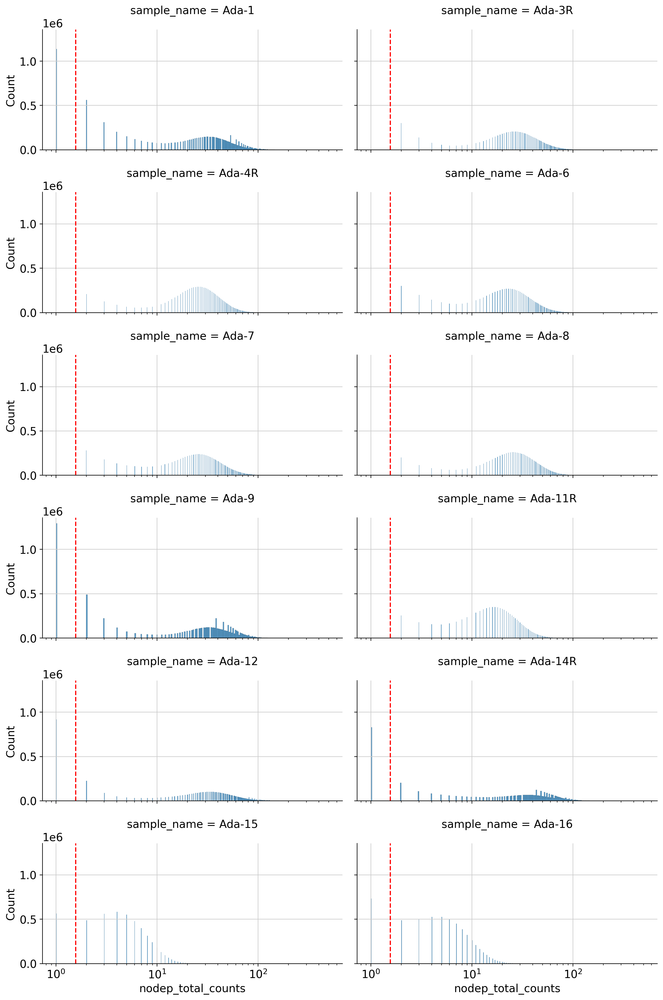

In [11]:
#examine transcript features
sc.set_figure_params(dpi = 100, transparent = True)
pf = sns.FacetGrid(df, col="sample_name", col_wrap=2, height=3, aspect=2)
pf.set_titles(pad=20)
pf.fig.subplots_adjust(wspace=2
                       #, hspace=0.5
                       , top=0.9
                       )
pf.map_dataframe(sns.histplot
                 , 'nodep_total_counts'
                 , kde=False
                 , log_scale=10
                 )
# Iterate through the axes and add a vertical line to each
for ax in pf.axes.flat:
    ax.axvline(x=25/16, color='r', linestyle='--')
    # If using individual lines:
    # ax.axvline(x=line_positions.pop(0), color='r', linestyle='--')

plt.tight_layout()
plt.show()

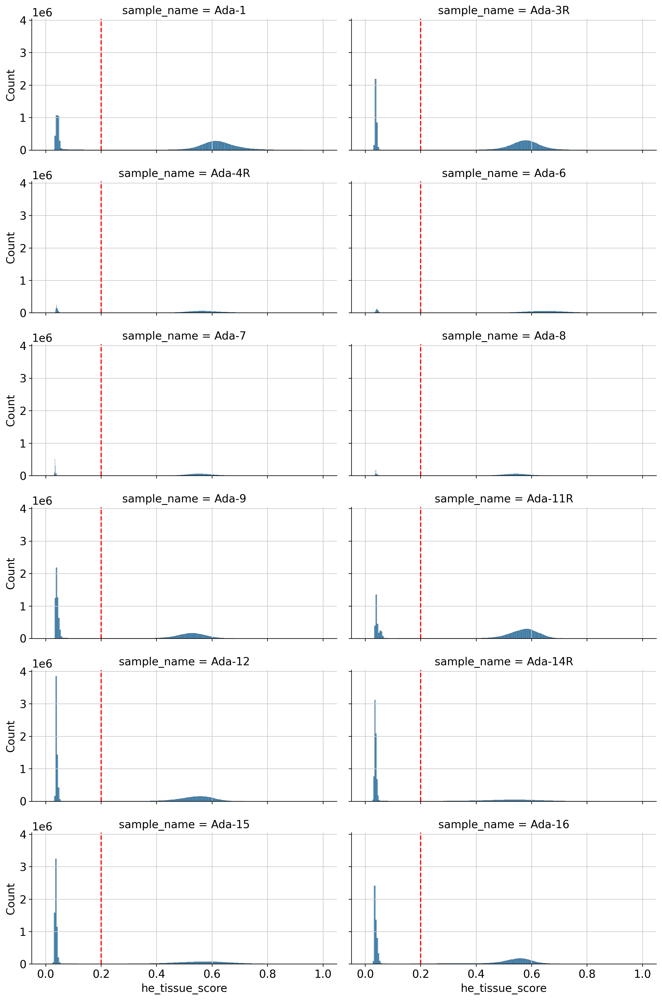

In [12]:
#examine tissue features
pf = sns.FacetGrid(df, col="sample_name", col_wrap=2, height=3, aspect=2)
pf.map_dataframe(sns.histplot
                 , 'he_tissue_score'
                 , kde=False
                 #, log_scale=10
                 )
# Iterate through the axes and add a vertical line to each
for ax in pf.axes.flat:
    ax.axvline(x=0.2, color='r', linestyle='--')
    # If using individual lines:
    # ax.axvline(x=line_positions.pop(0), color='r', linestyle='--')

plt.tight_layout()
plt.show()

In [13]:
# Specify the gene of interest
measure_of_interest1 = "nodep_total_counts"
measure_of_interest2 = "he_tissue_score"

threshold1 = 25/16
threshold2 = 0.2

for sample_name in sample_names:
    s_name = "sample_" + sample_name
    #sdata_ls[s_name].tables['square_002um'].obs['sample_name'] = sample_name
    adata = sdata_ls[s_name].tables['square_002um']
    measure_1 = adata.obs[measure_of_interest1]
    measure_2 = adata.obs[measure_of_interest2]
    # Create a new column 'cell type new' based on 'cell type'
    adata.obs['qc_class'] = "tissue-low_transcript-low"
    if adata.obs['qc_class'].dtype.name == "category":
        new_categories = ["tissue-low_transcript-low", "tissue-low_transcript-high"
                          , "tissue-high_transcript-high", "tissue-high_transcript-low"]
        adata.obs['qc_class'] = adata.obs['qc_status'].cat.add_categories(new_categories)
        # Update the new column for cells with GeneA expression > threshold
    adata.obs.loc[(measure_1 < threshold1) & \
    (measure_2 < threshold2), 'qc_class'] = "tissue-low_transcript-low"
    adata.obs.loc[(measure_1 >= threshold1) & \
    (measure_2 < threshold2), 'qc_class'] = "tissue-low_transcript-high"
    adata.obs.loc[(measure_1 >= threshold1) & \
    (measure_2 >= threshold2), 'qc_class'] = "tissue-high_transcript-high"
    adata.obs.loc[(measure_1 < threshold1) & \
    (measure_2 >= threshold2), 'qc_class'] = "tissue-high_transcript-low"
#use one as example
sdata_ls[s_name].tables['square_002um'].obs

,in_tissue,array_row,array_col,location_id,region,he_tissue_score,he_tissue_score_in_bounds,total_counts,deprecated_counts,deprecated_pct,nodep_n_genes_by_counts,nodep_total_counts,nodep_pct_counts_in_top_50_genes,nodep_pct_counts_in_top_100_genes,nodep_pct_counts_in_top_200_genes,nodep_pct_counts_in_top_500_genes,sample_name,qc_class
s_002um_00000_00000-1,0,0,0,0,Ada-16_square_002um,0.032609,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
s_002um_00000_00001-1,0,0,1,1,Ada-16_square_002um,0.032609,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
s_002um_00000_00002-1,0,0,2,2,Ada-16_square_002um,0.032609,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
s_002um_00000_00003-1,0,0,3,3,Ada-16_square_002um,0.032609,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
s_002um_00000_00004-1,0,0,4,4,Ada-16_square_002um,0.032609,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_002um_03349_03345-1,0,3349,3345,11222495,Ada-16_square_002um,0.038466,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
s_002um_03349_03346-1,0,3349,3346,11222496,Ada-16_square_002um,0.038453,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
s_002um_03349_03347-1,0,3349,3347,11222497,Ada-16_square_002um,0.038440,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low
s_002um_03349_03348-1,0,3349,3348,11222498,Ada-16_square_002um,0.038427,True,0.0,0.0,0.0,0,0.0,NaN,NaN,NaN,NaN,Ada-16,tissue-low_transcript-low


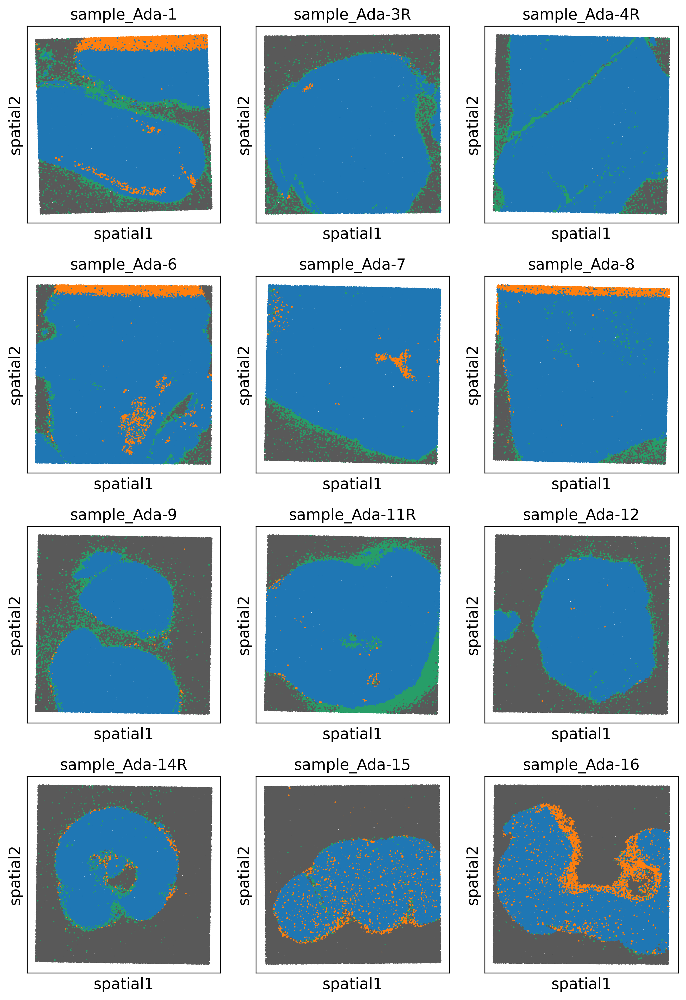

In [30]:
# Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(4, 3, figsize=(9, 13), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="qc_class",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none',
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

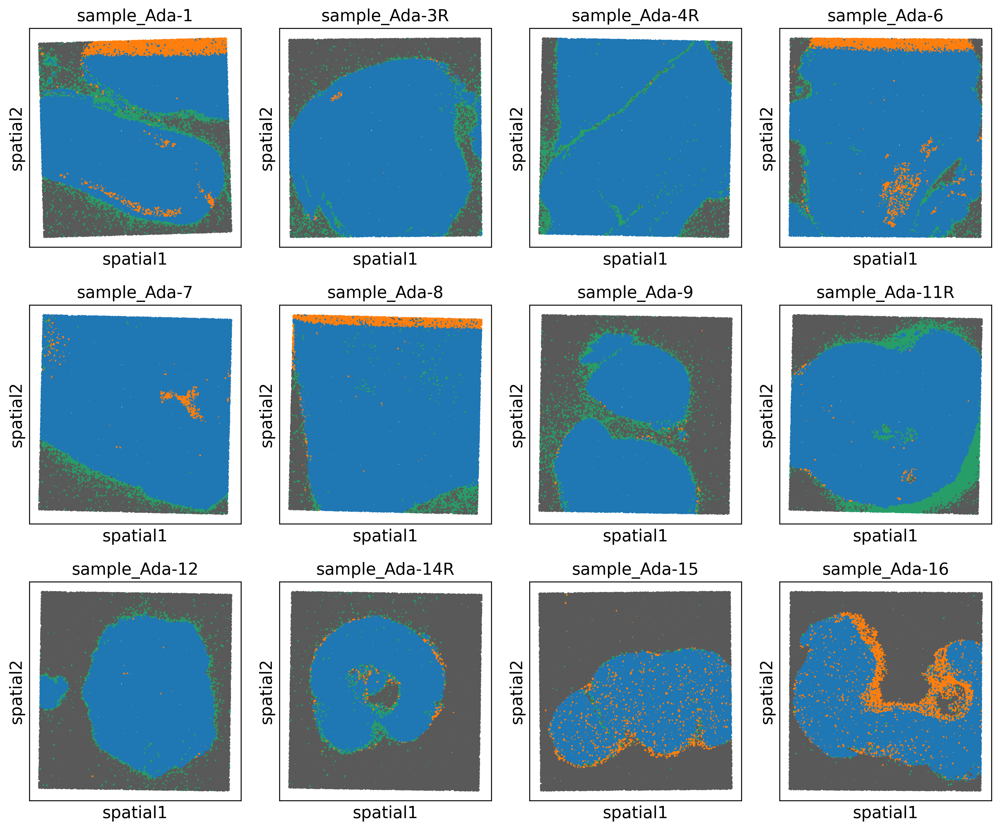

In [32]:
# Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(3, 4, figsize=(12, 10), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="qc_class",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none',
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

In [33]:
# prepare a temp merged adata object
adata_merged = [sdata.tables['square_002um'] for key, sdata in sdata_ls.items()]
adata_merged = dict(zip(sample_names, adata_merged)) 
adata_merged = ad.concat(
    adata_merged,
    label="sample_name",  # Creates a new .obs column tracking the dictionary keys
    index_unique="-",  # Appends the key to cell barcode indices to ensure uniqueness
    join="outer",  # Use 'inner' if you only want the intersection of genes/variables
)

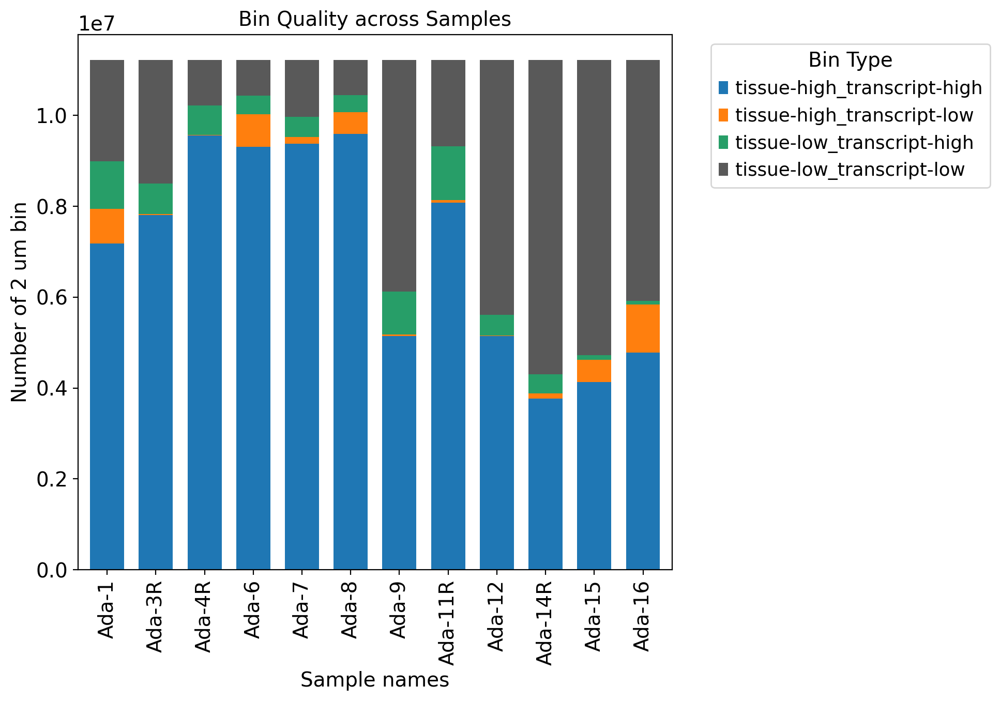

In [34]:
# Create a cross-tabulation of cell types by condition
# Change 'cell_type' and 'condition' to match your adata.obs column names
adata_merged.uns['qc_class_colors'] = ['#1f77b4', '#ff7f0e', '#279e68','#595959']
cmp = adata_merged.uns['qc_class_colors'].copy()
#fig,ax = plt.subplots(figsize=(5, 5.5), dpi = 150)

# Define the exact order you want
my_order = sample_names#get sample names

adata_merged.obs['sample_name'] = adata_merged.obs['sample_name'].astype('category')

adata_merged.obs['sample_name'] = pd.Categorical(adata_merged.obs['sample_name']
                                                 , categories=my_order, ordered=True)

cross_tab = pd.crosstab(adata_merged.obs['qc_class'], adata_merged.obs['sample_name'])

# Plot as a stacked bar chart
ax = cross_tab.T.plot(kind='bar', stacked=True, figsize=(10, 7), color=cmp, width=0.7)
# Format the plot
plt.margins(x=0.05) 
plt.ylabel('Number of 2 um bin')
plt.xlabel('Sample names')
plt.title('Bin Quality across Samples')
plt.legend(title='Bin Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.tight_layout()
plt.show()

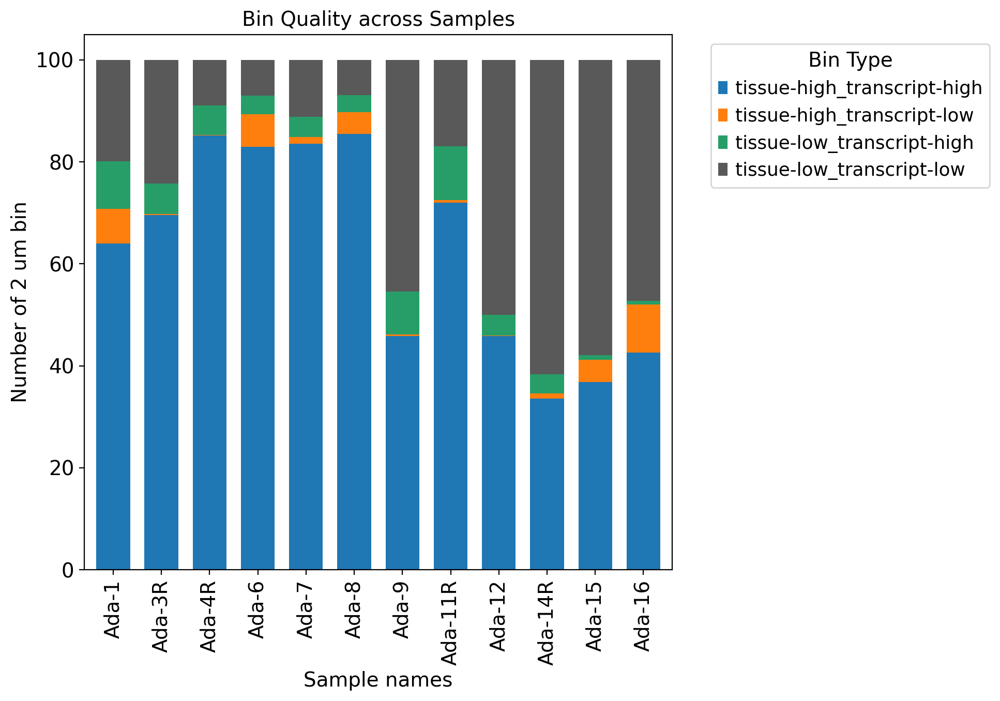

In [35]:
# Create a cross-tabulation of cell types by condition
# Change 'cell_type' and 'condition' to match your adata.obs column names
adata_merged.uns['qc_class_colors'] = ['#1f77b4', '#ff7f0e', '#279e68','#595959']
cmp = adata_merged.uns['qc_class_colors'].copy()
#fig,ax = plt.subplots(figsize=(5, 5.5), dpi = 150)

adata_merged.obs['sample_name'] = pd.Categorical(adata_merged.obs['sample_name']
                                                 , categories=my_order, ordered=True)

cross_tab = pd.crosstab(adata_merged.obs['qc_class']
                        , adata_merged.obs['sample_name'], normalize='columns') * 100

# Plot as a stacked bar chart
ax = cross_tab.T.plot(kind='bar', stacked=True, figsize=(10, 7), color=cmp, width=0.7)
# Format the plot
plt.margins(x=0.05) 
plt.ylabel('Number of 2 um bin')
plt.xlabel('Sample names')
plt.title('Bin Quality across Samples')
plt.legend(title='Bin Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.tight_layout()
plt.show()

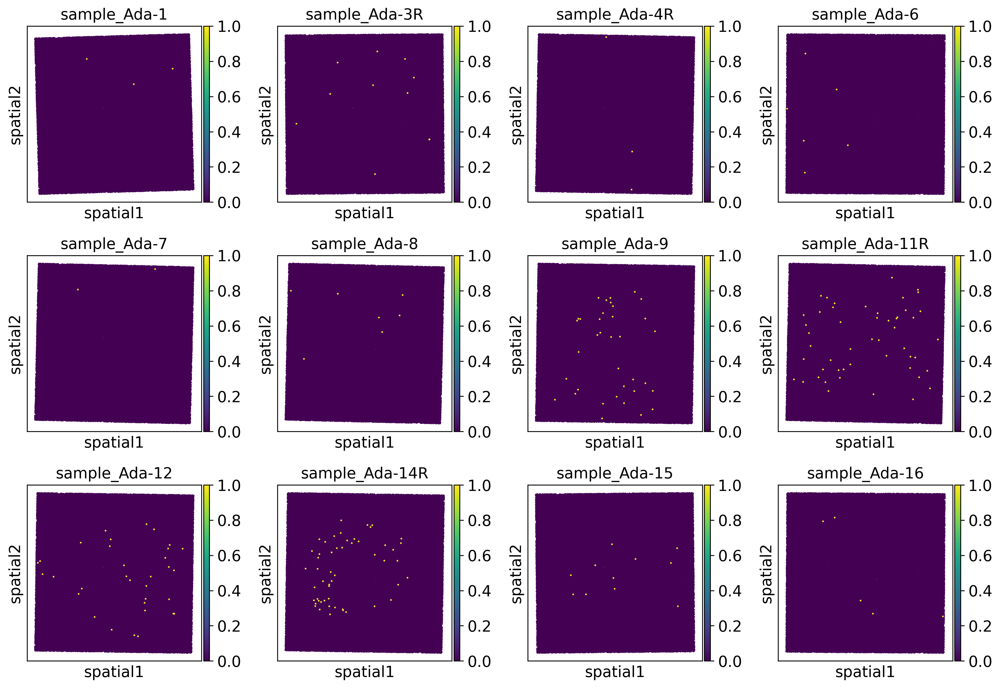

In [36]:
# Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(3, 4, figsize=(13, 9), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="Foxp3",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none', vmax = 1.0,
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

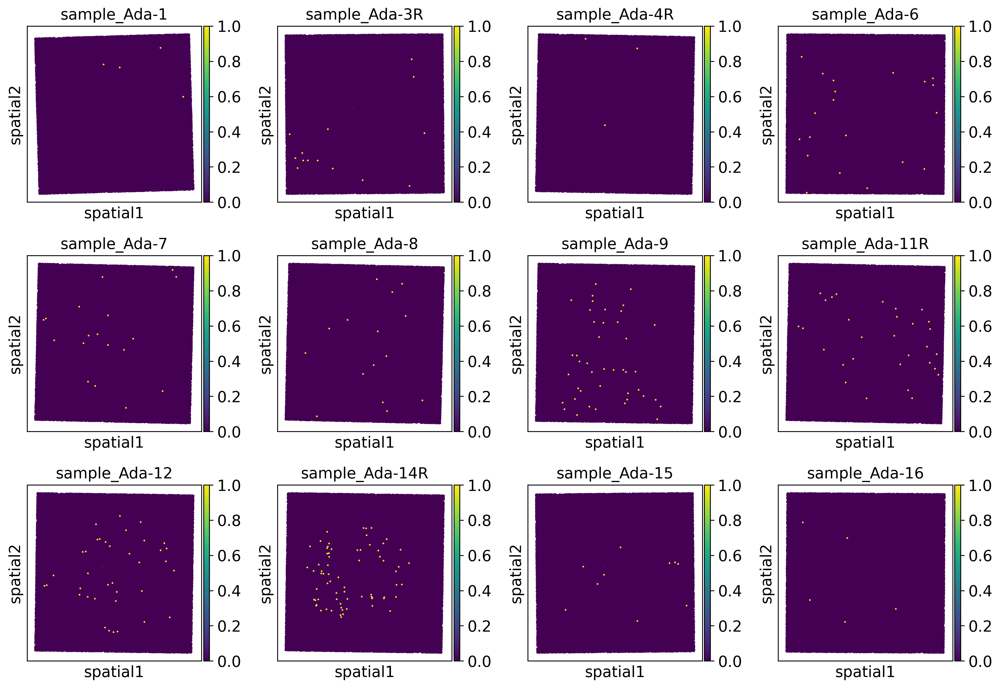

In [37]:
# Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(3, 4, figsize=(13, 9), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="Ctla4",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none', vmax = 1.0,
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

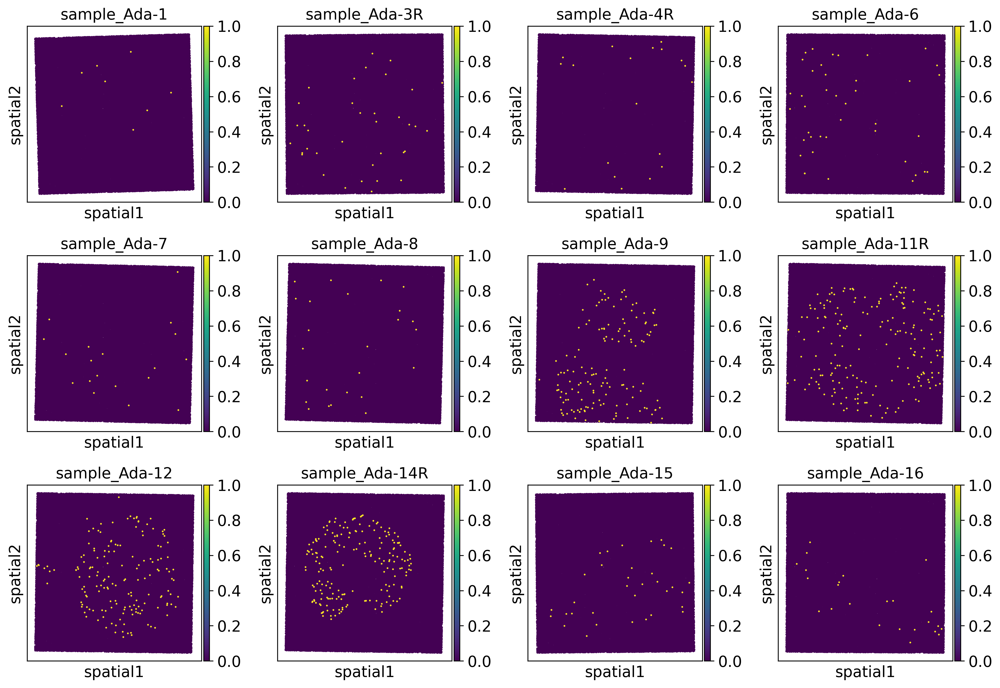

In [38]:
# Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(3, 4, figsize=(13, 9), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="Cd4",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none', vmax = 1.0,
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

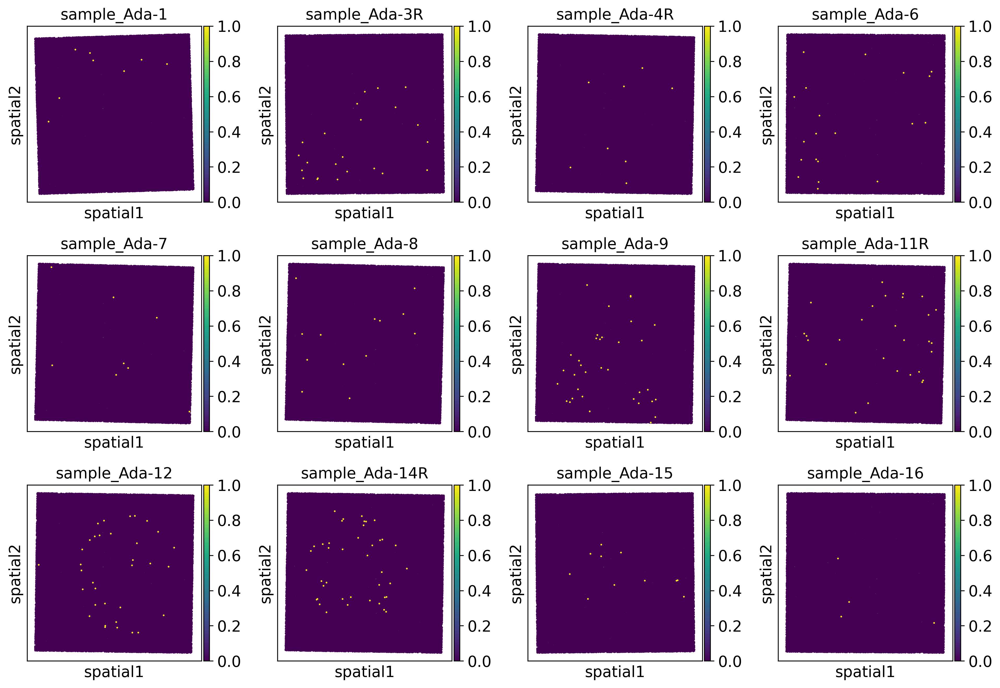

In [39]:
 # Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(3, 4, figsize=(13, 9), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="Il2ra",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none', vmax = 1.0,
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

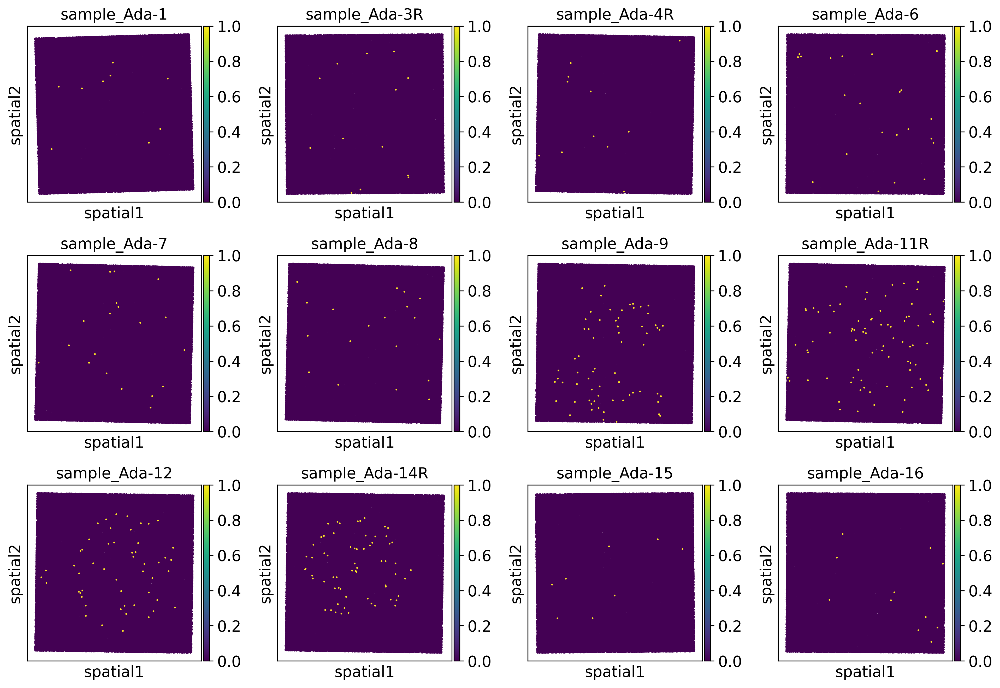

In [40]:
 # Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(3, 4, figsize=(13, 9), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="Il7r",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none', vmax = 1.0,
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

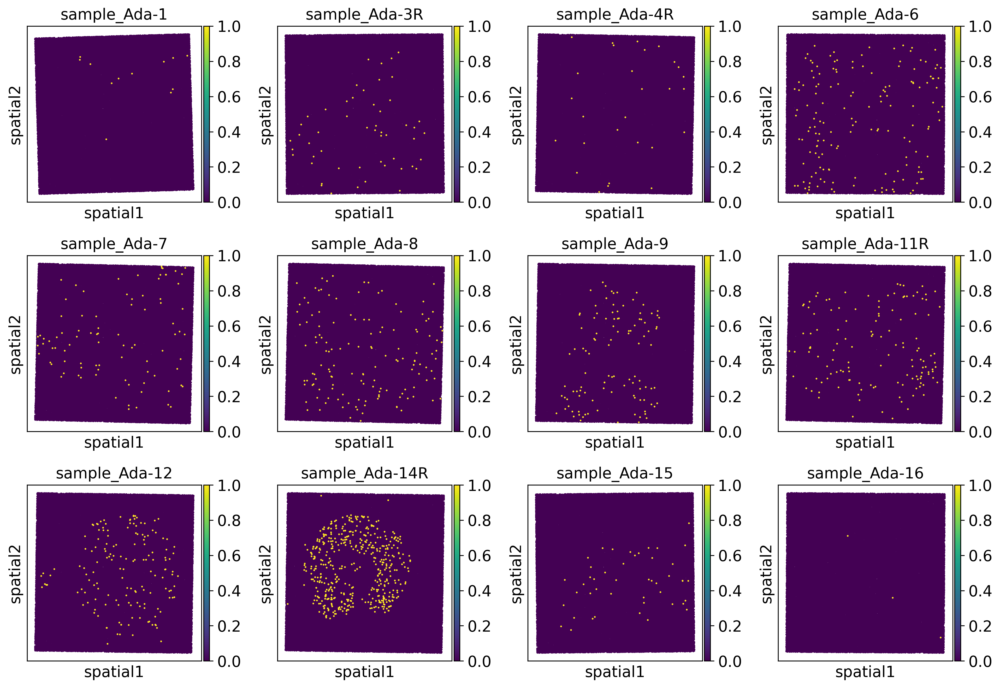

In [41]:
 # Assume 'adata_dict' is your dictionary of 12 AnnData objects
keys = list(sdata_ls.keys())
# 1. Create a 4x3 figure grid
fig, axes = plt.subplots(3, 4, figsize=(13, 9), dpi=150)
axes = axes.flatten()  # Flatten into a 1D array of 12 slots for easy looping

# 2. Loop through your 12 objects and plot them
for i, key in enumerate(keys):
    adata = sdata_ls[key].tables['square_002um']
    adata.uns['qc_class_colors'] = (['#1f77b4', '#ff7f0e', '#279e68','#595959'])
    ax = axes[i]

    # Downsample (e.g., 1:5000 ratio or adjusting fraction as needed)
    fraction_val = 1 / 100
    adata_sampled = sc.pp.subsample(adata, fraction=fraction_val, copy=True, random_state=13)

    # Plot onto the specific subplot axis
    sc.pl.embedding(
        adata_sampled,
        basis="spatial",  # change to 'tsne', 'pca', etc. if needed
        color="Cd8a",  # change to your gene or metadata column
        title=key, size=10, legend_loc = 'none', vmax = 1.0,
        ax=ax,
        show=False,  # Prevents showing individual plots early
    )
# 3. Optimize layout and display
plt.tight_layout()
plt.show()

In [42]:
#update the .zarr file on disk for all the slots that were changed 
for key, s in sdata_ls.items():
    report_info = "Now we are working on spatialdata: " + key
    print(report_info)
    persist_changes(
        s,
        update_elements=["square_002um"],
        #new_elements=["annotations_clean", "qc.annotation", 'tumor_stromal.annotation'],
        update_transformations=True,
        consolidate_metadata=True,
    )

Now we are working on spatialdata: sample_Ada-1
[store] /stash/data/nonclin/TBIO-8110_VisiumHD-Adagrasib-mouseTumor/zarr_files/Ada-1.zarr

[persist plan]
  full data rewrites: ['square_002um']
  transformation-only: []
  new elements: []

[data rewrite] tables/square_002um
[backup] temporary element: backup_square_002um_df353758
[backup] written: backup_square_002um_df353758
[data rewrite] old on-disk element removed: square_002um
[data rewrite] updated element written: square_002um

[metadata] writing SpatialData metadata
[metadata] consolidating Zarr metadata

[done] selected changes persisted successfully.
Now we are working on spatialdata: sample_Ada-3R
[store] /stash/data/nonclin/TBIO-8110_VisiumHD-Adagrasib-mouseTumor/zarr_files/Ada-3R.zarr

[persist plan]
  full data rewrites: ['square_002um']
  transformation-only: []
  new elements: []

[data rewrite] tables/square_002um
[backup] temporary element: backup_square_002um_855fac18
[backup] written: backup_square_002um_855fac18
[da

In [43]:
#print environment and packages used
%watermark -d -i -m -iv -v --gpu

Python implementation: CPython
Python version       : 3.10.6
IPython version      : 8.16.1

Compiler    : GCC 7.5.0
OS          : Linux
Release     : 6.1.158-178.288.amzn2023.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 96
Architecture: 64bit

numpy      : 1.24.4
sys        : 3.10.6 (main, Oct 11 2023, 09:47:13) [GCC 7.5.0]
seaborn    : 0.13.2
pandas     : 2.2.3
spatialdata: 0.3.0
anndata    : 0.11.4
squidpy    : 1.6.5
re         : 2.2.1
geopandas  : 1.0.1
watermark  : 2.5.0
scanpy     : 1.10.0
matplotlib : 3.8.4

GPU Info: NVIDIA drivers do not appear to be installed on this machine.



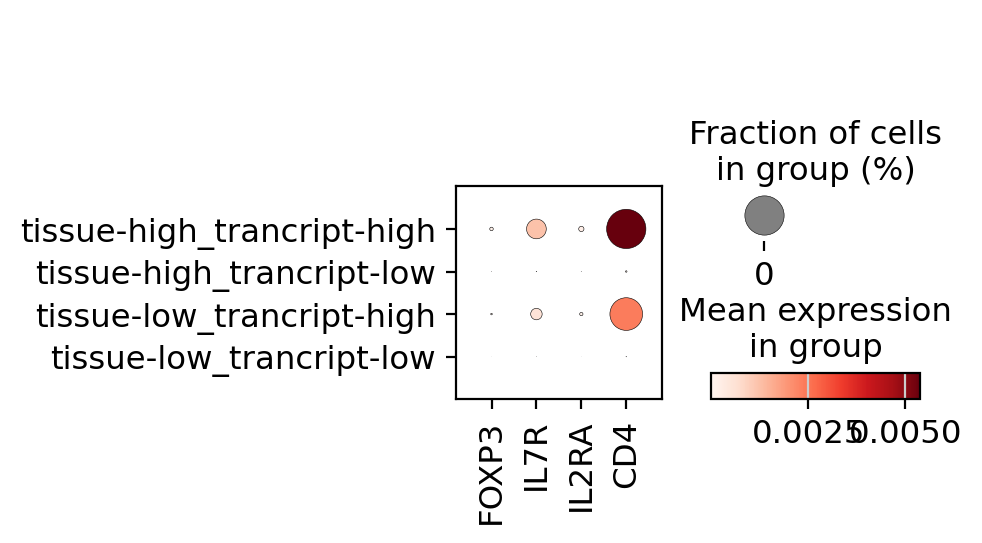

In [25]:
#
marker_genes = marker_genes = [
    *["FOXP3", "IL7R", "IL2RA", "CD4"],
]
sc.pl.dotplot(adata_merged, marker_genes, groupby="qc_class", dot_min = 0, dot_max = 0.003)

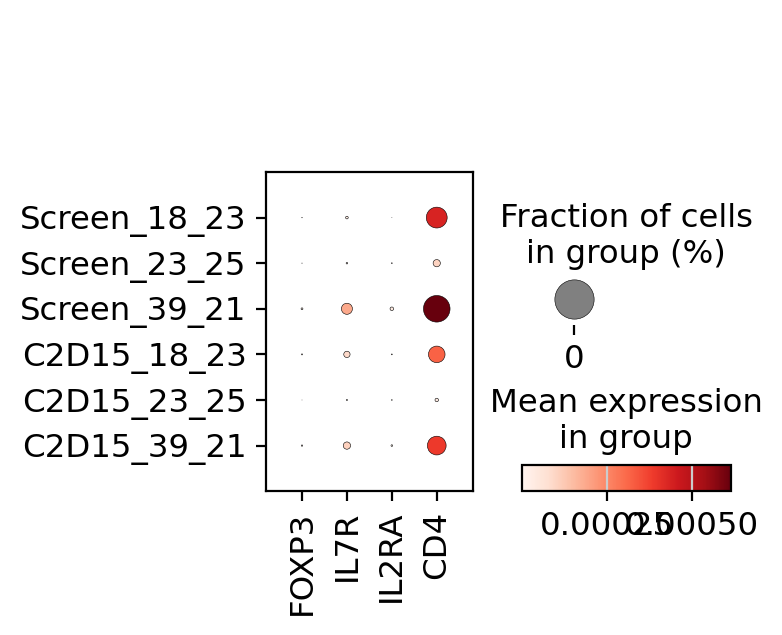

In [26]:
#
marker_genes = marker_genes = [
    *["FOXP3", "IL7R", "IL2RA", "CD4"],
]
sc.pl.dotplot(adata_merged, marker_genes, groupby="sample_name", dot_min = 0, dot_max = 0.001)

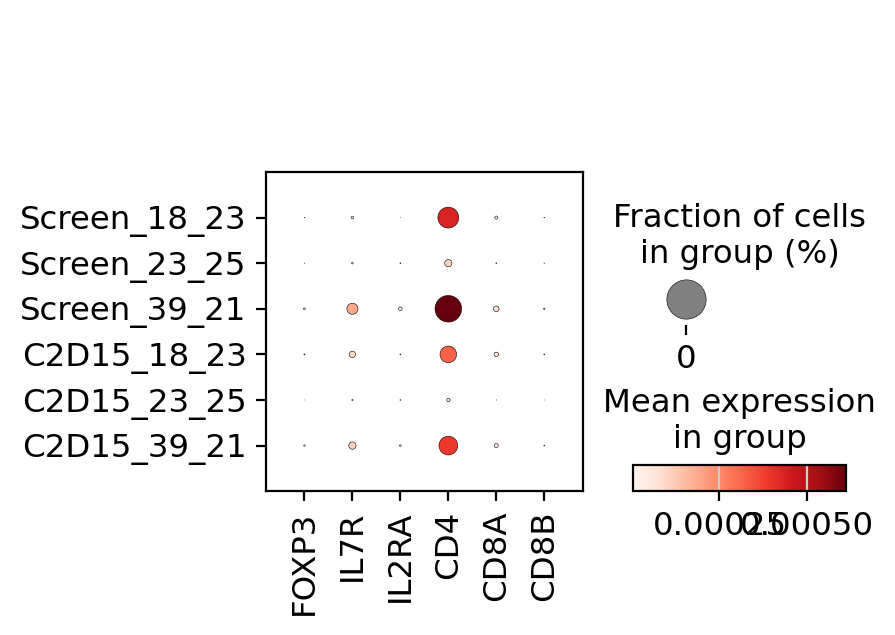

In [27]:
#
marker_genes = marker_genes = [
    *["FOXP3", "IL7R", "IL2RA", "CD4", "CD8A", "CD8B"],
]
sc.pl.dotplot(adata_merged, marker_genes, groupby="sample_name", dot_min = 0, dot_max = 0.001)

In [31]:

adata_merged.obs["sample_name"].unique()

['Screen_16_22', 'Screen_17_26', 'Screen_30_16', 'C2D15_16_22', 'C2D15_17_26', 'C2D15_30_16']
Categories (6, object): ['Screen_16_22' < 'Screen_17_26' < 'Screen_30_16' < 'C2D15_16_22' < 'C2D15_17_26' < 'C2D15_30_16']

In [28]:
# Calculate cell counts per cell type per sample
cell_counts = pd.crosstab(adata_merged.obs["sample_name"], adata_merged.obs["qc_class"])

# Optional: To calculate the fraction of cells instead of raw counts
cell_fractions = pd.crosstab(adata_merged.obs["sample_name"], adata_merged.obs["qc_class"], normalize="index")

# Display the resulting DataFrame
print(cell_counts)

qc_class      tissue-high_trancript-high  tissue-high_trancript-low  \
sample_name                                                           
Screen_18_23                     1723556                     101119   
Screen_23_25                      599657                    1040648   
Screen_39_21                      381723                     466328   
C2D15_18_23                       380642                       4544   
C2D15_23_25                       205343                     322317   
C2D15_39_21                       122250                      21408   

qc_class      tissue-low_trancript-high  tissue-low_trancript-low  
sample_name                                                        
Screen_18_23                     124873                   9272952  
Screen_23_25                     103502                   9478693  
Screen_39_21                      60129                  10314320  
C2D15_18_23                       93335                   9159448  
C2D15_23_25            

In [ ]:
#get sample names
sample_names = ['Screen_18_23', 'Screen_23_25', 'Screen_39_21'
                , 'C2D15_18_23', 'C2D15_23_25', 'C2D15_39_21']

In [29]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'FOXP3'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_Screen_18_23'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing FOXP3 > 0.5: 33


In [30]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'CD8A'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_Screen_18_23'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing CD8A > 0.5: 379


In [31]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'FOXP3'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_Screen_23_25'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing FOXP3 > 0.5: 22


In [32]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'CD8A'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_Screen_23_25'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing CD8A > 0.5: 75


In [33]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'FOXP3'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_Screen_39_21'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing FOXP3 > 0.5: 194


In [34]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'CD8A'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_Screen_39_21'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing CD8A > 0.5: 830


In [35]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'FOXP3'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_C2D15_18_23'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing FOXP3 > 0.5: 79


In [36]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'CD8A'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_C2D15_18_23'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing CD8A > 0.5: 527


In [37]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'FOXP3'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_C2D15_23_25'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing FOXP3 > 0.5: 5


In [38]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'CD8A'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_C2D15_23_25'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing CD8A > 0.5: 13


In [39]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'FOXP3'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_C2D15_39_21'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing FOXP3 > 0.5: 111


In [40]:
# Replace 'Gene_Symbol' with your gene's name and 'threshold' with your number
gene_name = 'CD8A'
threshold = 0.5

# Calculate the number of cells
num_cells = (sdata_ls['sample_C2D15_39_21'].tables['square_002um'][:, gene_name].X > threshold).sum()

print(f"Number of cells expressing {gene_name} > {threshold}: {num_cells}")

Number of cells expressing CD8A > 0.5: 469
